In [1]:
!pip install plotly==4.9.0
!pip install jupyterlab “ipywidgets>=7.5”
!jupyter labextension install jupyterlab-plotly@4.9.0
!jupyter labextension install @jupyter-widgets/jupyterlab-manager plotlywidget@4.9.0

  Using cached plotly-4.9.0-py2.py3-none-any.whl (12.9 MB)
Processing /home/jovyan/.cache/pip/wheels/c4/a7/48/0a434133f6d56e878ca511c0e6c38326907c0792f67b476e56/retrying-1.3.3-py3-none-any.whl
ERROR: Invalid requirement: '“ipywidgets'
Building jupyterlab assets (build:prod:minimize)
Building jupyterlab assets (build:prod:minimize)


In [2]:
!jupyter lab build

[LabBuildApp] JupyterLab 2.2.8
[LabBuildApp] Building in /opt/conda/share/jupyter/lab
[LabBuildApp] Building jupyterlab assets (build:prod:minimize)


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import   StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [2]:
df = pd.read_csv('NFA 2018.csv')
df

,country,ISO alpha-3 code,UN_region,UN_subregion,year,record,crop_land,grazing_land,forest_land,fishing_ground,built_up_land,carbon,total,Percapita GDP (2010 USD),population
0,Armenia,ARM,Asia,Western Asia,1992,BiocapPerCap,1.611286e-01,0.135023,0.083836,0.013718,0.033669,0.000000e+00,4.273741e-01,949.033,3449000
1,Armenia,ARM,Asia,Western Asia,1992,BiocapTotGHA,5.558130e+05,465763.337400,289190.662300,47320.224590,116139.598200,0.000000e+00,1.474227e+06,949.033,3449000
2,Armenia,ARM,Asia,Western Asia,1992,EFConsPerCap,3.909225e-01,0.189137,0.000001,0.004138,0.033669,1.112225e+00,1.730092e+00,949.033,3449000
3,Armenia,ARM,Asia,Western Asia,1992,EFConsTotGHA,1.348487e+06,652429.066600,4.327841,14272.803690,116139.598200,3.836620e+06,5.967954e+06,949.033,3449000
4,Armenia,ARM,Asia,Western Asia,1992,EFExportsPerCap,1.124910e-03,0.002283,0.000000,0.000438,0.000000,4.819043e-02,5.203676e-02,949.033,3449000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87015,Luxembourg,LUX,Europe,Western Europe,1999,EFExportsTotGHA,2.727690e+05,38693.594850,529781.310300,38598.597570,0.000000,4.697928e+06,5.577771e+06,87516.400,446000
87016,Luxembourg,LUX,Europe,Western Europe,1999,EFImportsPerCap,9.640340e-01,0.513370,2.175907,0.182401,0.000000,1.672241e+01,2.055812e+01,87516.400,446000
87017,Luxembourg,LUX,Europe,Western Europe,1999,EFImportsTotGHA,4.299939e+05,228981.371100,970532.711500,81357.251260,0.000000,7.458795e+06,9.169660e+06,87516.400,446000
87018,Luxembourg,LUX,Europe,Western Europe,1999,EFProdPerCap,4.959092e-01,0.093481,0.448416,0.000000,0.115181,6.242095e+00,7.395082e+00,87516.400,446000


In [3]:
year_val = df['year'].unique()
print(year_val)

[1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 1961 1962 1963 1964 1965
 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979
 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991]


In [4]:
record_val = df['record'].unique()
print(record_val)

['BiocapPerCap' 'BiocapTotGHA' 'EFConsPerCap' 'EFConsTotGHA'
 'EFExportsPerCap' 'EFExportsTotGHA' 'EFImportsPerCap' 'EFImportsTotGHA'
 'EFProdPerCap' 'EFProdTotGHA']


In [5]:
country_val = df['country'].unique()
print(country_val)

['Armenia' 'Afghanistan' 'Albania' 'Algeria' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Australia' 'Austria' 'Bahamas'
 'Bahrain' 'Barbados' 'Bangladesh' 'Bermuda' 'Bhutan' 'Bolivia' 'Botswana'
 'Brazil' 'Aruba' 'Belize' 'Brunei Darussalam' 'Bulgaria' 'Myanmar'
 'Burundi' 'Cameroon' 'Canada' 'Cabo Verde' 'Cayman Islands'
 'Central African Republic' 'Sri Lanka' 'Chad' 'Chile' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' 'Cuba' 'Cyprus'
 'Czechoslovakia' 'Azerbaijan' 'Benin' 'Denmark' 'Dominica'
 'Dominican Republic' 'Belarus' 'Ecuador' 'Egypt' 'El Salvador'
 'Equatorial Guinea' 'Ethiopia PDR' 'Estonia' 'Fiji' 'Finland' 'France'
 'French Guiana' 'French Polynesia' 'Djibouti' 'Georgia' 'Gabon' 'Gambia'
 'Germany' 'Bosnia and Herzegovina' 'Ghana' 'Kiribati' 'Greece' 'Grenada'
 'Guadeloupe' 'Guatemala' 'Guinea' 'Guyana' 'Haiti' 'Honduras' 'Hungary'
 'Croatia' 'India' 'Indonesia' 'Iran, Islamic Republic of' 'Iraq'
 'Ireland' 'Israel' 'Italy' "Côte d'Ivoire" 'Kazakhstan' 'Jamai

In [6]:
len(country_val)

196

In [7]:
dataset = df[['country', 'UN_region','year', 'population', 'Percapita GDP (2010 USD)', 'record', 'total']]

In [8]:
dataset

,country,UN_region,year,population,Percapita GDP (2010 USD),record,total
0,Armenia,Asia,1992,3449000,949.033,BiocapPerCap,4.273741e-01
1,Armenia,Asia,1992,3449000,949.033,BiocapTotGHA,1.474227e+06
2,Armenia,Asia,1992,3449000,949.033,EFConsPerCap,1.730092e+00
3,Armenia,Asia,1992,3449000,949.033,EFConsTotGHA,5.967954e+06
4,Armenia,Asia,1992,3449000,949.033,EFExportsPerCap,5.203676e-02
...,...,...,...,...,...,...,...
87015,Luxembourg,Europe,1999,446000,87516.400,EFExportsTotGHA,5.577771e+06
87016,Luxembourg,Europe,1999,446000,87516.400,EFImportsPerCap,2.055812e+01
87017,Luxembourg,Europe,1999,446000,87516.400,EFImportsTotGHA,9.169660e+06
87018,Luxembourg,Europe,1999,446000,87516.400,EFProdPerCap,7.395082e+00


In [9]:
#Reformatage
new_data = pd.DataFrame()
line_index =  0
for i in country_val:
    for j in year_val:
        data = dataset.loc[(dataset['country'] == i) & (dataset['year'] == j), :].reset_index(drop=True)
        if data.shape[0] > 0:
            data_clean = pd.pivot_table(data, values='total', columns= 'record')
            new_data = new_data.append(data_clean, ignore_index=True, verify_integrity=False)

            new_data.loc[line_index, 'country'] = i
            new_data.loc[line_index, 'year'] = j
            new_data.loc[line_index, 'population'] = data.loc[0,'population']
            new_data.loc[line_index, 'Percapita GDP (2010 USD)'] = data.loc[0,'Percapita GDP (2010 USD)']
            new_data.loc[line_index, 'UN_region'] = data.loc[0,'UN_region']

            line_index += 1
        
new_data.head()       

,BiocapPerCap,BiocapTotGHA,EFConsPerCap,EFConsTotGHA,EFExportsPerCap,EFExportsTotGHA,EFImportsPerCap,EFImportsTotGHA,EFProdPerCap,EFProdTotGHA,country,year,population,Percapita GDP (2010 USD),UN_region
0,0.427374,1474226.795,1.730092,5967953.592,0.052037,179500.7888,0.378541,1305775.892,1.403588,4841678.489,Armenia,1992.0,3449000.0,949.033,Asia
1,0.430176,1449550.644,1.158431,3903530.447,0.043202,145577.7965,0.367973,1239947.538,0.833660,2809160.705,Armenia,1993.0,3370000.0,886.033,Asia
2,0.441324,1451930.964,1.115877,3671166.697,0.044654,146907.4052,0.536515,1765102.972,0.624015,2052971.130,Armenia,1994.0,3290000.0,956.471,Asia
3,0.457846,1475715.242,1.028198,3314056.537,0.054844,176772.2410,0.362787,1169323.130,0.720255,2321505.649,Armenia,1995.0,3223000.0,1043.540,Asia
4,0.504369,1600580.482,1.038000,3294021.456,0.046258,146795.4065,0.431828,1370375.583,0.652430,2070441.280,Armenia,1996.0,3173000.0,1121.880,Asia


In [10]:
new_data =  new_data.sort_values(by=['year'])
new_data.head()

,BiocapPerCap,BiocapTotGHA,EFConsPerCap,EFConsTotGHA,EFExportsPerCap,EFExportsTotGHA,EFImportsPerCap,EFImportsTotGHA,EFProdPerCap,EFProdTotGHA,country,year,population,Percapita GDP (2010 USD),UN_region
4631,6.099161,5.141209e+07,1.414395,1.192246e+07,0.724898,6.110433e+06,0.495319,4.175226e+06,1.643974,1.385766e+07,Malaysia,1961.0,8429000.0,1468.62,Asia
2229,1.198994,3.409040e+06,1.125719,3.200701e+06,0.222507,6.326437e+05,0.223231,6.347024e+05,1.124995,3.198643e+06,El Salvador,1961.0,2843000.0,NaN,Latin America and the Caribbean
6839,4.566072,1.285203e+07,2.576719,7.252638e+06,0.174493,4.911407e+05,0.049891,1.404280e+05,2.701320,7.603351e+06,Somalia,1961.0,2815000.0,NaN,Africa
4312,0.485037,9.044004e+05,1.678716,3.130134e+06,0.187070,3.488109e+05,1.100456,2.051910e+06,0.765331,1.427035e+06,Lebanon,1961.0,1865000.0,NaN,Asia
4901,1.352349,9.183060e+05,0.903736,6.136776e+05,0.158450,1.075945e+05,0.689470,4.681809e+05,0.372716,2.530911e+05,Mauritius,1961.0,679000.0,NaN,Africa


In [11]:
new_data['year'].unique()

array([1961., 1962., 1963., 1964., 1965., 1966., 1967., 1968., 1969.,
       1970., 1971., 1972., 1973., 1974., 1975., 1976., 1977., 1978.,
       1979., 1980., 1981., 1982., 1983., 1984., 1985., 1986., 1987.,
       1988., 1989., 1990., 1991., 1992., 1993., 1994., 1995., 1996.,
       1997., 1998., 1999., 2000., 2001., 2002., 2003., 2004., 2005.,
       2006., 2007., 2008., 2009., 2010., 2011., 2012., 2013., 2014.])

In [12]:
new_data['year'] = new_data['year'].astype('int')
new_data['year'].unique()

array([1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014])

In [13]:
#new_data['year'] = new_data['year'].astype(int)

In [14]:
data_final = new_data[['country', 'UN_region', 'year', 'population', 'Percapita GDP (2010 USD)', 'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA']]
data_final

,country,UN_region,year,population,Percapita GDP (2010 USD),EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
4631,Malaysia,Asia,1961,8429000.0,1468.62,6.110433e+06,4.175226e+06,1.385766e+07,5.141209e+07
2229,El Salvador,Latin America and the Caribbean,1961,2843000.0,NaN,6.326437e+05,6.347024e+05,3.198643e+06,3.409040e+06
6839,Somalia,Africa,1961,2815000.0,NaN,4.911407e+05,1.404280e+05,7.603351e+06,1.285203e+07
4312,Lebanon,Asia,1961,1865000.0,NaN,3.488109e+05,2.051910e+06,1.427035e+06,9.044004e+05
4901,Mauritius,Africa,1961,679000.0,NaN,1.075945e+05,4.681809e+05,2.530911e+05,9.183060e+05
...,...,...,...,...,...,...,...,...,...
5040,Montserrat,Latin America and the Caribbean,2014,5000.0,NaN,1.364488e+03,7.463947e+03,1.746602e+04,6.881474e+03
153,Algeria,Africa,2014,38934000.0,4675.89,6.412893e+06,3.851574e+07,6.323773e+07,2.108411e+07
2228,El Salvador,Latin America and the Caribbean,2014,6108000.0,3668.20,2.596444e+06,6.484575e+06,8.313816e+06,3.749626e+06
5723,Panama,Latin America and the Caribbean,2014,3868000.0,10229.20,3.404537e+06,3.298270e+06,9.097804e+06,1.117411e+07


In [15]:
data_final.rename(index=str, columns={'Percapita GDP (2010 USD)': 'Percapita_GDP_2010_USD'}, inplace=True)
data_final.columns

/opt/conda/lib/python3.8/site-packages/pandas/core/frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


Index(['country', 'UN_region', 'year', 'population', 'Percapita_GDP_2010_USD',
       'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'],
      dtype='object')

In [16]:
print("Nombre de ligne : {}".format(data_final.shape[0]))
print()

Nombre de ligne : 8702



In [17]:
data_final.describe(include='all')

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
count,8702,8702,8702.000000,8.702000e+03,7141.000000,8.702000e+03,8.702000e+03,8.702000e+03,8.702000e+03
unique,196,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Gabon,Africa,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,54,2769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,1989.193059,6.305956e+07,10129.722779,2.464773e+07,2.696064e+07,1.661292e+08,1.356011e+08
std,NaN,NaN,15.491724,4.264615e+08,15647.192957,1.167042e+08,1.204758e+08,1.146272e+09,8.726467e+08
min,NaN,NaN,1961.000000,5.000000e+03,115.794000,3.255577e+00,7.463947e+03,1.746602e+04,6.881474e+03
25%,NaN,NaN,1976.000000,2.001250e+06,988.470000,4.525078e+05,6.293089e+05,3.691057e+06,3.646152e+06
50%,NaN,NaN,1990.000000,6.632500e+06,3153.740000,2.030172e+06,2.606313e+06,1.326049e+07,1.567923e+07
75%,NaN,NaN,2003.000000,2.055950e+07,11972.100000,1.070014e+07,1.215187e+07,4.778909e+07,5.036317e+07


In [18]:
print("Taux de valeurs manquantes: ")
display(100*data_final.isnull().sum()/data_final.shape[0])

Taux de valeurs manquantes: 


country                    0.000000
UN_region                  0.000000
year                       0.000000
population                 0.000000
Percapita_GDP_2010_USD    17.938405
EFExportsTotGHA            0.000000
EFImportsTotGHA            0.000000
EFProdTotGHA               0.000000
BiocapTotGHA               0.000000
dtype: float64

In [19]:
data_final['Percapita_GDP_2010_USD'].replace('', np.nan, inplace=True)

/opt/conda/lib/python3.8/site-packages/pandas/core/series.py:4563: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


In [20]:
#remplacer les val manquantes avec celles des lignes précédentes
data_final.ffill(inplace=True)
#data_final.fillna(data_final.mode()) #valeur la plus présente
#data_final.dropna(axis=0)

/opt/conda/lib/python3.8/site-packages/pandas/core/frame.py:4317: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [21]:
print("Taux de valeurs manquantes: ")
display(100*data_final.isnull().sum()/data_final.shape[0])

Taux de valeurs manquantes: 


country                   0.0
UN_region                 0.0
year                      0.0
population                0.0
Percapita_GDP_2010_USD    0.0
EFExportsTotGHA           0.0
EFImportsTotGHA           0.0
EFProdTotGHA              0.0
BiocapTotGHA              0.0
dtype: float64

In [22]:
#les données des pays sauf celle du monde
data_final_word = data_final[(data_final['country'] == 'World')]
data_final_word.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
8671,World,World,1961,3.075073e+09,3799.76,492915450.9,473185309.1,7.035243e+09,9.611344e+09
8672,World,World,1962,3.133554e+09,3943.36,512500982.8,484079134.9,7.265996e+09,9.667879e+09
8673,World,World,1963,3.194075e+09,4064.65,542564357.1,516778701.1,7.550641e+09,9.666112e+09
8674,World,World,1964,3.256988e+09,4248.49,562081259.5,533121334.0,7.864634e+09,9.712774e+09
8675,World,World,1965,3.322495e+09,4394.72,575925562.7,552724395.2,8.155050e+09,9.736612e+09


In [23]:
data_final_word =  data_final_word.sort_values(by=['year'])
data_final_word.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
8671,World,World,1961,3.075073e+09,3799.76,492915450.9,473185309.1,7.035243e+09,9.611344e+09
8672,World,World,1962,3.133554e+09,3943.36,512500982.8,484079134.9,7.265996e+09,9.667879e+09
8673,World,World,1963,3.194075e+09,4064.65,542564357.1,516778701.1,7.550641e+09,9.666112e+09
8674,World,World,1964,3.256988e+09,4248.49,562081259.5,533121334.0,7.864634e+09,9.712774e+09
8675,World,World,1965,3.322495e+09,4394.72,575925562.7,552724395.2,8.155050e+09,9.736612e+09


In [24]:
#les données des pays sauf celle du monde
data_final_allCountry = data_final[(data_final['country'] != 'World')]
data_final_allCountry

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
4631,Malaysia,Asia,1961,8429000.0,1468.62,6.110433e+06,4.175226e+06,1.385766e+07,5.141209e+07
2229,El Salvador,Latin America and the Caribbean,1961,2843000.0,1468.62,6.326437e+05,6.347024e+05,3.198643e+06,3.409040e+06
6839,Somalia,Africa,1961,2815000.0,1468.62,4.911407e+05,1.404280e+05,7.603351e+06,1.285203e+07
4312,Lebanon,Asia,1961,1865000.0,1468.62,3.488109e+05,2.051910e+06,1.427035e+06,9.044004e+05
4901,Mauritius,Africa,1961,679000.0,1468.62,1.075945e+05,4.681809e+05,2.530911e+05,9.183060e+05
...,...,...,...,...,...,...,...,...,...
5040,Montserrat,Latin America and the Caribbean,2014,5000.0,107153.00,1.364488e+03,7.463947e+03,1.746602e+04,6.881474e+03
153,Algeria,Africa,2014,38934000.0,4675.89,6.412893e+06,3.851574e+07,6.323773e+07,2.108411e+07
2228,El Salvador,Latin America and the Caribbean,2014,6108000.0,3668.20,2.596444e+06,6.484575e+06,8.313816e+06,3.749626e+06
5723,Panama,Latin America and the Caribbean,2014,3868000.0,10229.20,3.404537e+06,3.298270e+06,9.097804e+06,1.117411e+07


In [25]:
data_final_allCountry.to_csv("allcountries.csv")

In [26]:
region = data_final_allCountry['UN_region'].unique()
region 

array(['Asia', 'Latin America and the Caribbean', 'Africa', 'Oceania',
       'Europe', 'North America'], dtype=object)

## Evolution de l'empreinte carbone et de la bio capacité dans le monde

In [27]:
import plotly.express as px
data_final_word = data_final_word
fig = px.area(data_final_word, x="year", y=["EFProdTotGHA", "population", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], title="Evolution de empreinte écologique, la population et de la bio capacité dans le monde")
fig.show()

## Empreinte carbone liée à la production par région

In [28]:
import plotly.express as px
data_final_allCountry = data_final_allCountry
fig = px.area(data_final_allCountry, x="year", y="EFProdTotGHA", line_group='country', color='UN_region', title="Empreinte écologique liée à la production par région")
fig.show()

## Bio capacité par région

In [29]:
import plotly.express as px
data_final_allCountry = data_final_allCountry
fig = px.area(data_final_allCountry, x="year", y="BiocapTotGHA", line_group='country', color='UN_region', title="Evolution de la Bio capacié par région")
fig.show()

In [30]:
import plotly.express as px
data_final_allCountry = data_final_allCountry
fig = px.area(data_final_allCountry, x="year", y=["BiocapTotGHA", "population"], line_group='country', title="Evolution de la démographie et de la Bio capacité à travers le monde")
fig.show()

## Evolution de l'empreinte carbone et de la bio capacité en Asie

In [31]:
#les données de l'asie
data_final_Rasia = data_final_allCountry[(data_final_allCountry['UN_region'] == 'Asia')]
data_final_Rasia.sort_values(by=['year'])
data_final_Rasia.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
4631,Malaysia,Asia,1961,8429000.0,1468.620,6.110433e+06,4.175226e+06,1.385766e+07,5.141209e+07
4312,Lebanon,Asia,1961,1865000.0,1468.620,3.488109e+05,2.051910e+06,1.427035e+06,9.044004e+05
7244,Syrian Arab Republic,Asia,1961,4743000.0,19394.600,9.966186e+05,1.168479e+06,4.386950e+06,5.788234e+06
1001,Myanmar,Asia,1961,21962000.0,156.215,2.590710e+06,6.005720e+05,1.504438e+07,6.232724e+07
4258,Lao People's Democratic Republic,Asia,1961,2169000.0,481.377,7.021777e+03,2.100252e+05,3.182432e+06,8.294114e+06


In [32]:
data_final_Rasia = data_final_Rasia
fig = px.area(data_final_Rasia, x="year", y=["EFProdTotGHA", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], line_group='country')
fig.show()

In [33]:
taux_Asie = (data_final_Rasia['BiocapTotGHA'] - (data_final_Rasia['EFProdTotGHA'] + (data_final_Rasia['EFImportsTotGHA']-data_final_Rasia['EFExportsTotGHA']))).sum()/data_final_Rasia['BiocapTotGHA'].sum()*100
taux_Asie

-91.31302353013848

## Evolution de l'empreinte carbone et de la bio capacité en Afrique

In [34]:
#les données de l'Afrique
data_final_Rafrica = data_final_allCountry[(data_final_allCountry['UN_region'] == 'Africa')]
data_final_Rafrica.sort_values(by=['year'])
data_final_Rafrica.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
6839,Somalia,Africa,1961,2815000.0,1468.620,4.911407e+05,1.404280e+05,7.603351e+06,1.285203e+07
4901,Mauritius,Africa,1961,679000.0,1468.620,1.075945e+05,4.681809e+05,2.530911e+05,9.183060e+05
2732,Gambia,Africa,1961,377000.0,1468.620,2.288771e+05,1.160783e+05,5.351460e+05,1.460554e+06
2175,Egypt,Africa,1961,27810000.0,641.132,2.018631e+06,4.618452e+06,1.969318e+07,1.176091e+07
5215,Namibia,Africa,1961,617000.0,4717.320,2.427430e+06,6.584645e+05,2.986105e+06,1.632765e+07


In [35]:
data_final_Rafrica = data_final_Rafrica
fig = px.area(data_final_Rafrica, x="year", y=["EFProdTotGHA", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], line_group='country')
fig.show()

## Evolution de l'empreinte carbone et de la bio capacité en Océani

In [36]:
#les données de l'Oceani
data_final_Roceania = data_final_allCountry[(data_final_allCountry['UN_region'] == 'Oceania')]
data_final_Roceania.sort_values(by=['year'])
data_final_Roceania.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
8239,Samoa,Oceania,1961,112000.0,1468.62,4.743766e+04,1.069310e+05,1.043941e+05,2.787266e+05
351,Australia,Oceania,1961,10495000.0,19394.60,4.654944e+07,5.152004e+06,1.198038e+08,3.063679e+08
5800,Papua New Guinea,Oceania,1961,2001000.0,1181.84,3.768458e+05,4.719463e+05,2.371667e+06,2.569811e+07
2380,Fiji,Oceania,1961,407000.0,1774.50,1.399998e+05,2.375790e+05,3.598315e+05,1.940023e+06
5400,New Zealand,Oceania,1961,2424000.0,17861.90,1.418643e+07,2.123476e+06,2.376442e+07,4.498746e+07


In [37]:
data_final_Roceania = data_final_Roceania
fig = px.area(data_final_Roceania, x="year", y=["EFProdTotGHA", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], line_group='country')
fig.show()

## Evolution de l'empreinte carbone et de la bio capacité en Europe

In [38]:
#les données de l'Europe
data_final_Reurope = data_final_allCountry[(data_final_allCountry['UN_region'] == 'Europe')]
data_final_Reurope.sort_values(by=['year'])
data_final_Reurope.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
6070,Portugal,Europe,1961,8899000.0,4717.320,1.979302e+06,3.857137e+06,1.883513e+07,1.133711e+07
7793,USSR,Europe,1961,217822000.0,481.377,2.938818e+07,1.143472e+07,8.760607e+08,1.132727e+09
8483,Belgium,Europe,1961,9120000.0,13804.200,1.863428e+07,3.259102e+07,3.848873e+07,8.108194e+06
6016,Poland,Europe,1961,30138000.0,245.199,8.702889e+06,1.228003e+07,1.168813e+08,6.489598e+07
100,Albania,Europe,1961,1686000.0,710.667,6.620486e+04,4.586572e+05,2.847176e+06,2.764542e+06


In [39]:
data_final_Reurope= data_final_Reurope
fig = px.area(data_final_Reurope, x="year", y=["EFProdTotGHA", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], line_group='country')
fig.show()

## Evolution de l'empreinte carbone et de la bio capacité en Latin America and the Caribbean

In [40]:
#les données de Latin America and the Caribbean
data_final_Ramlatin = data_final_allCountry[(data_final_allCountry['UN_region'] == 'Latin America and the Caribbean')]
data_final_Ramlatin.sort_values(by=['year'])
data_final_Ramlatin.head()


,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
2229,El Salvador,Latin America and the Caribbean,1961,2843000.0,1468.620,6.326437e+05,6.347024e+05,3.198643e+06,3.409040e+06
1723,Cuba,Latin America and the Caribbean,1961,7290000.0,19394.600,1.301971e+06,3.117147e+06,9.147635e+06,6.982895e+06
2989,Guadeloupe,Latin America and the Caribbean,1961,281000.0,641.132,2.693044e+04,1.734614e+05,2.271913e+05,2.536698e+05
829,Brazil,Latin America and the Caribbean,1961,74707000.0,3668.020,9.104050e+06,7.967291e+06,1.808158e+08,1.701658e+09
3043,Guatemala,Latin America and the Caribbean,1961,4240000.0,1480.510,6.092792e+05,6.275440e+05,5.646655e+06,1.060106e+07


In [41]:
data_final_Ramlatin= data_final_Ramlatin
fig = px.area(data_final_Ramlatin, x="year", y=["EFProdTotGHA", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], line_group='country')
fig.show()

In [42]:
taux_AmLatCara = (data_final_Ramlatin['BiocapTotGHA'] - (data_final_Ramlatin['EFProdTotGHA'] + (data_final_Ramlatin['EFImportsTotGHA']-data_final_Ramlatin['EFExportsTotGHA']))).sum()/data_final_Ramlatin['BiocapTotGHA'].sum()*100
taux_AmLatCara

64.23556788113235

## Evolution de l'empreinte carbone et de la bio capacité en Amerique du Nord

In [43]:
#les données de Amerique du nord
data_final_Ramnord = data_final_allCountry[(data_final_allCountry['UN_region'] == 'North America')]
data_final_Ramnord=data_final_Ramnord.sort_values(by=['year'])
data_final_Ramnord.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
636,Bermuda,North America,1961,46000.0,28436.7,8.148370e+04,1.435243e+05,5.971688e+04,8.489803e+03
7924,United States of America,North America,1961,189077000.0,17142.2,8.941710e+07,1.015468e+08,1.510653e+09,9.466789e+08
1163,Canada,North America,1961,18296000.0,17861.9,6.710060e+07,1.662374e+07,1.865763e+08,4.803825e+08
637,Bermuda,North America,1962,47000.0,29006.6,8.417719e+04,1.443458e+05,5.388586e+04,8.478949e+03
7925,United States of America,North America,1962,191861000.0,17910.3,9.039223e+07,1.074585e+08,1.559405e+09,9.395272e+08


In [44]:
data_final_Ramnord= data_final_Ramnord
fig = px.area(data_final_Ramnord, x="year", y=["EFProdTotGHA", "EFImportsTotGHA", "EFExportsTotGHA", "BiocapTotGHA"], line_group='country')
fig.show()

In [45]:
#sns.distplot(data_final_word.iloc[:, -1], kde=True)
#plt.title('Estimation de la distribution')

In [46]:
data_final_benin = data_final_allCountry[(data_final_allCountry['country'] == 'Benin')]
import plotly.express as px
fig = px.line(data_frame = data_final_benin, 
              x = 'year', 
              y= ['EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'], 
              title = 'Evolution de la Bio capacité et de impreinte écologique dans le temps au Bénin')
fig.show(renderer = 'iframe')

In [47]:
#les données de Amerique du nord
data_final_Benin = data_final_allCountry[(data_final_allCountry['country'] == 'Benin')]
data_final_Ramnord=data_final_Benin.sort_values(by=['year'])
data_final_Benin.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
1882,Benin,Africa,1961,2466000.0,529.297,84533.61073,164867.6040,3167496.783,8014254.378
1883,Benin,Africa,1962,2503000.0,503.599,54833.11049,164701.7548,3183477.000,7894022.434
1884,Benin,Africa,1963,2543000.0,519.131,59813.47127,173622.5732,3182469.364,7770582.769
1885,Benin,Africa,1964,2586000.0,544.428,62130.30066,167159.7331,3207873.371,7675096.763
1886,Benin,Africa,1965,2632000.0,563.146,80547.55400,184530.9687,3245839.523,7628981.132


In [48]:
taux_Benin = (data_final_Benin['BiocapTotGHA'] - (data_final_Benin['EFProdTotGHA'] + (data_final_Benin['EFImportsTotGHA']-data_final_Benin['EFExportsTotGHA']))).sum()/data_final_Benin['BiocapTotGHA'].sum()*100
taux_Benin

16.528158808538723

In [49]:
data_final_gabon = data_final_allCountry[(data_final_allCountry['country'] == 'Gabon')]
import plotly.express as px
fig = px.line(data_frame = data_final_gabon, 
              x = 'year', 
              y= ['EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'], 
              title = 'Evolution de la Bio capacité et de impreinte écologique dans le temps au Gabon')
fig.show(renderer = 'iframe')

In [50]:
data_final_newz = data_final_allCountry[(data_final_allCountry['country'] == 'New Zealand')]
import plotly.express as px
fig = px.line(data_frame = data_final_newz, 
              x = 'year', 
              y= ['EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'], 
              title = 'Evolution de la Bio capacité et de impreinte écologique dans le temps en data_final_newz')
fig.show(renderer = 'iframe')

In [51]:
data_final_brazil = data_final_allCountry[(data_final_allCountry['country'] == 'Brazil')]
import plotly.express as px
fig = px.line(data_frame = data_final_brazil, 
              x = 'year', 
              y= ['EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'], 
              title = 'Evolution de la Bio capacité et de impreinte écologique dans le temps au brazil')
fig.show(renderer = 'iframe')

In [52]:
data_final_usa= data_final_allCountry[(data_final_allCountry['country'] == 'United States of America')]
import plotly.express as px
fig = px.line(data_frame = data_final_usa, 
              x = 'year', 
              y= ['EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'], 
              title = 'Evolution de la Bio capacité et de impreinte écologique dans le temps au USA')
fig.show(renderer = 'iframe')

In [53]:
data_final_france= data_final_allCountry[(data_final_allCountry['country'] == 'France')]
import plotly.express as px
fig = px.line(data_frame = data_final_france, 
              x = 'year', 
              y= ['EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA', 'BiocapTotGHA'], 
              title = 'Evolution de la Bio capacité et de impreinte écologique dans le temps au USA')
fig.show(renderer = 'iframe')

## Prediction sur le monde


In [54]:
# Decoupage en variables expicatives et cible
x = data_final_word[['year', 'population', 'Percapita_GDP_2010_USD', 'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA']].values
y = data_final_word['BiocapTotGHA'].values


In [55]:
y[0:5]

array([9.61134352e+09, 9.66787937e+09, 9.66611230e+09, 9.71277438e+09,
       9.73661215e+09])

In [56]:
x[0:5]

array([[1.96100000e+03, 3.07507300e+09, 3.79976000e+03, 4.92915451e+08,
        4.73185309e+08, 7.03524287e+09],
       [1.96200000e+03, 3.13355400e+09, 3.94336000e+03, 5.12500983e+08,
        4.84079135e+08, 7.26599592e+09],
       [1.96300000e+03, 3.19407500e+09, 4.06465000e+03, 5.42564357e+08,
        5.16778701e+08, 7.55064067e+09],
       [1.96400000e+03, 3.25698800e+09, 4.24849000e+03, 5.62081260e+08,
        5.33121334e+08, 7.86463395e+09],
       [1.96500000e+03, 3.32249500e+09, 4.39472000e+03, 5.75925563e+08,
        5.52724395e+08, 8.15505000e+09]])

In [57]:
#decoupage en en train et test 
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state = 0)

In [58]:
#normalisation
#stscaler = StandardScaler()
#stscaler.fit(x_train)
#stscaler.fit(x_test)

#x_train = stscaler.transform(x_train)
#x_test = stscaler.transform(x_test)

In [59]:
#x_test

In [60]:
#construction du modele
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [61]:
y_pred = regressor.predict(x_test)

In [62]:
y_pred_2030 = regressor.predict(x_test)

In [63]:
y_pred

array([1.21520151e+10, 1.12079930e+10, 1.19135805e+10, 1.08023394e+10,
       1.00415673e+10, 9.70381089e+09, 1.11636716e+10, 1.16310464e+10,
       1.17406321e+10, 1.10527707e+10, 9.76900350e+09, 1.00034947e+10,
       1.09257152e+10, 1.05836623e+10, 1.11075535e+10, 1.14516369e+10,
       1.14013747e+10])

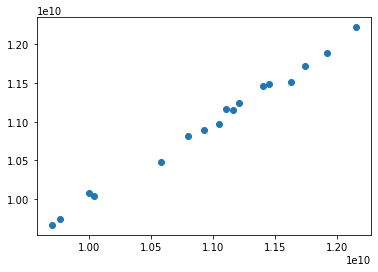

In [64]:
plt.scatter(y_pred, y_test)

### Evaluation

In [65]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.9938976060241228

In [66]:
# tableau de bord statistique

import statsmodels.api as sm
model1 = sm.OLS(y_train, x_train)
result = model1.fit()
#print(result.summary())
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.802e+05
Date:                Wed, 16 Jun 2021   Prob (F-statistic):                    5.61e-69
Time:                        20:57:56   Log-Likelihood:                         -713.84
No. Observations:                  37   AIC:                                      1440.
Df Residuals:                      31   BIC:                                      1449.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1          4.042e+06   1.04e+05     38.900      0.000    3.83e+06    4.25e+06
x2             0.6792      0.092      7.411      0.000       0.492       0.866
x3          -8.33e+04   1.32e+05     -0.633      0.531   -3.52e+05    1.85e+05
x4            -0.2600      0.800     -0.325      0.747      -1.892       1.372
x5             0.3196      0.823      0.388      0.700      -1.358       1.998
x6            -0.0114      0.046     -0.248      0.806      -0.105       0.082
==============================================================================
Omnibus:                        0.923   Durbin-Watson:                   1.830
Prob(Omnibus):                  0.630   Jarque-Bera (JB):                0.742
Skew:                          -0.336   Prob(JB):                        0.690
Kurtosis:                       2.826   Cond. No.                     2.11e+08
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.11e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Tous les pays

In [67]:
#les données des pays sauf celle du monde
data_final_allCountry = data_final[(data_final['country'] != 'World')]
data_final_allCountry .head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
4631,Malaysia,Asia,1961,8429000.0,1468.62,6.110433e+06,4.175226e+06,1.385766e+07,5.141209e+07
2229,El Salvador,Latin America and the Caribbean,1961,2843000.0,1468.62,6.326437e+05,6.347024e+05,3.198643e+06,3.409040e+06
6839,Somalia,Africa,1961,2815000.0,1468.62,4.911407e+05,1.404280e+05,7.603351e+06,1.285203e+07
4312,Lebanon,Asia,1961,1865000.0,1468.62,3.488109e+05,2.051910e+06,1.427035e+06,9.044004e+05
4901,Mauritius,Africa,1961,679000.0,1468.62,1.075945e+05,4.681809e+05,2.530911e+05,9.183060e+05


In [68]:
data_final_allCountry =  data_final_allCountry.sort_values(by=['year'])
data_final_allCountry.head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
4631,Malaysia,Asia,1961,8429000.0,1468.62,6.110433e+06,4.175226e+06,1.385766e+07,5.141209e+07
3259,Honduras,Latin America and the Caribbean,1961,2069000.0,1085.57,6.872532e+05,2.717658e+05,6.363342e+06,1.613239e+07
3818,Jamaica,Latin America and the Caribbean,1961,1654000.0,2801.07,2.729744e+05,1.708348e+06,1.070759e+06,1.026044e+06
3205,Haiti,Latin America and the Caribbean,1961,3943000.0,2801.07,7.572717e+04,1.738564e+05,2.424873e+06,1.868318e+06
5908,Peru,Latin America and the Caribbean,1961,10350000.0,2801.07,3.692410e+06,2.197992e+06,2.969495e+07,1.127468e+08


In [69]:
data_final_allCountry.isnull().sum()

country                   0
UN_region                 0
year                      0
population                0
Percapita_GDP_2010_USD    0
EFExportsTotGHA           0
EFImportsTotGHA           0
EFProdTotGHA              0
BiocapTotGHA              0
dtype: int64

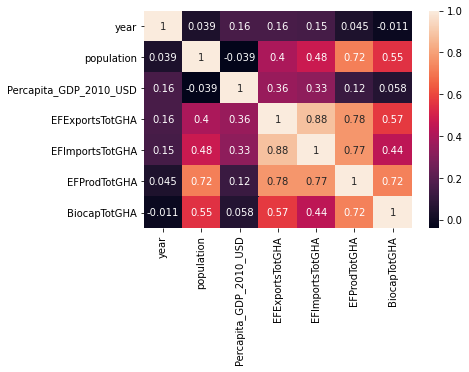

In [70]:
corrMatrix = data_final_allCountry.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

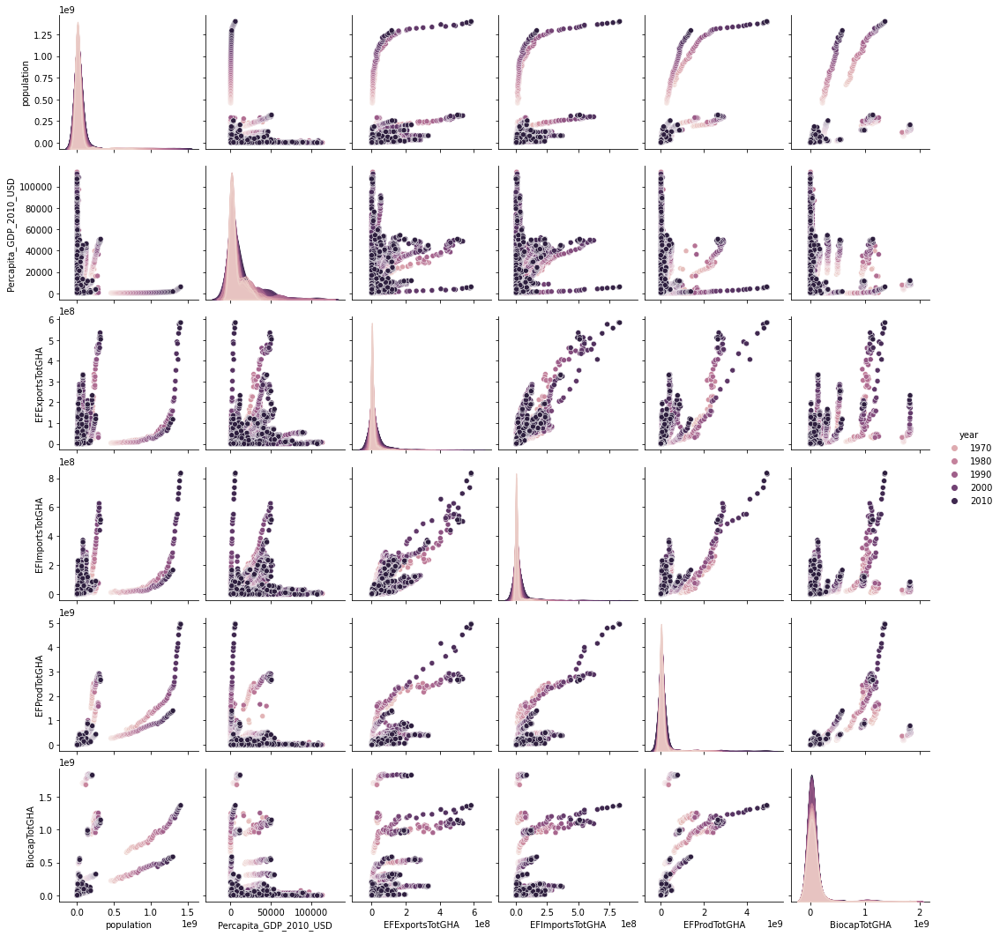

In [71]:
sns.pairplot (data_final_allCountry, hue = 'year')

In [72]:
#x = data_final_allCountry[['country','year', 'population', 'Percapita_GDP_2010_USD', 'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA']]

In [73]:
# Decoupage en variables expicatives et cible
features_list = ['country','year', 'population', 'Percapita_GDP_2010_USD', 'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA']
target_variable = 'BiocapTotGHA'
x = data_final_allCountry.loc[:, features_list]
y = data_final_allCountry.loc[:, target_variable]

In [74]:
print("...Done.")
print()

print('y : ')
print(y.head())
print()
print('x :')
print(x.head())

...Done.

y : 
4631    5.141209e+07
3259    1.613239e+07
3818    1.026044e+06
3205    1.868318e+06
5908    1.127468e+08
Name: BiocapTotGHA, dtype: float64

x :
       country  year  population  Percapita_GDP_2010_USD  EFExportsTotGHA  \
4631  Malaysia  1961   8429000.0                 1468.62     6.110433e+06   
3259  Honduras  1961   2069000.0                 1085.57     6.872532e+05   
3818   Jamaica  1961   1654000.0                 2801.07     2.729744e+05   
3205     Haiti  1961   3943000.0                 2801.07     7.572717e+04   
5908      Peru  1961  10350000.0                 2801.07     3.692410e+06   

      EFImportsTotGHA  EFProdTotGHA  
4631     4.175226e+06  1.385766e+07  
3259     2.717658e+05  6.363342e+06  
3818     1.708348e+06  1.070759e+06  
3205     1.738564e+05  2.424873e+06  
5908     2.197992e+06  2.969495e+07  


/opt/conda/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='BiocapTotGHA', ylabel='Density'>

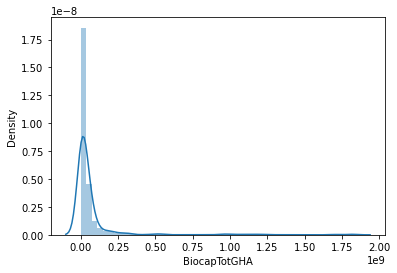

In [75]:
sns.distplot(y, kde=True)

In [76]:
# Détection automatique des positions des caractéristiques numériques/catégorielles
idx = 0
numeric_features = []
numeric_indices = []
categorical_features = []
categorical_indices = []
for i,t in x.dtypes.iteritems():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
        numeric_indices.append(idx)
    else :
        categorical_features.append(i)
        categorical_indices.append(idx)

    idx = idx + 1

print('Found numeric features ', numeric_features,' at positions ', numeric_indices)
print('Found categorical features ', categorical_features,' at positions ', categorical_indices)


Found numeric features  ['year', 'population', 'Percapita_GDP_2010_USD', 'EFExportsTotGHA', 'EFImportsTotGHA', 'EFProdTotGHA']  at positions  [1, 2, 3, 4, 5, 6]
Found categorical features  ['country']  at positions  [0]


In [77]:
#encodage des variables de categories
#from sklearn.preprocessing import LabelEncoder, OneHotEncoder
#LabelEncoder_x = LabelEncoder()
#x[:, 0] = LabelEncoder_x.fit_transform(x[:,0])

In [78]:
# Diviser le jeu de données Train set & Test set 
print("Dividing into train and test sets...")
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, 
                                                    random_state=0)
print("...Done.")
print()


Dividing into train and test sets...
...Done.



In [79]:
#Convert pandas DataFrames to numpy arrays before using scikit-learn

In [80]:
# Convert pandas DataFrames to numpy arrays before using scikit-learn
print("Convert pandas DataFrames to numpy arrays...")
x_train = x_train.values
x_test = x_test.values
y_train = y_train.tolist()
y_test = y_test.tolist()
print("...Done")

print(x_train[0:5,:])
print(x_test[0:2,:])
print()
print(y_train[0:5])
print(y_test[0:2])


Convert pandas DataFrames to numpy arrays...
...Done
[['Spain' 2001 41231000.0 29264.9 77571249.68 125124242.8 176322853.7]
 ['Mongolia' 2004 2497000.0 1961.49 1562097.531 927366.4341 16081871.08]
 ['Bahrain' 1994 549000.0 21623.0 4048144.546 4278814.115 5225727.328]
 ['Netherlands' 1983 14325000.0 29625.1 84521655.79 103128202.0
  56665209.46]
 ['Cambodia' 2001 12449000.0 454.07599999999996 335079.1722
  1382032.5980000002 10387215.1]]
[['El Salvador' 2011 6055000.0 3535.39 2548122.661 6508937.418
  8058816.5770000005]
 ['Djibouti' 1974 205000.0 2150.91 15738.04418 136804.3872 253563.5111]]

[64141075.31, 41552207.45, 661127.1182, 13800890.9, 10799966.12]
[3633733.083, 432713.1822]


In [81]:
# Missing values
from sklearn.impute import SimpleImputer

print("Imputing missing values...")
print(x_train[0:5,:])
print()
imputer = SimpleImputer(strategy="mean")
x_train[:,numeric_indices] = imputer.fit_transform(x_train[:,numeric_indices])
print("...Fini!")
print(x_train[0:5,:]) 
print()

Imputing missing values...
[['Spain' 2001 41231000.0 29264.9 77571249.68 125124242.8 176322853.7]
 ['Mongolia' 2004 2497000.0 1961.49 1562097.531 927366.4341 16081871.08]
 ['Bahrain' 1994 549000.0 21623.0 4048144.546 4278814.115 5225727.328]
 ['Netherlands' 1983 14325000.0 29625.1 84521655.79 103128202.0
  56665209.46]
 ['Cambodia' 2001 12449000.0 454.07599999999996 335079.1722
  1382032.5980000002 10387215.1]]

...Fini!
[['Spain' 2001.0 41231000.0 29264.9 77571249.68 125124242.8 176322853.7]
 ['Mongolia' 2004.0 2497000.0 1961.49 1562097.531 927366.4341 16081871.08]
 ['Bahrain' 1994.0 549000.0 21623.0 4048144.546 4278814.115 5225727.328]
 ['Netherlands' 1983.0 14325000.0 29625.1 84521655.79 103128202.0
  56665209.46]
 ['Cambodia' 2001.0 12449000.0 454.07599999999996 335079.1722
  1382032.5980000002 10387215.1]]



In [82]:
# Encoding categorical features and standardizing numerical features
print("Encoding categorical features and standardizing numerical features...")
print()
print(x_train[0:5,:])

# Normalization
numeric_transformer = StandardScaler()

# OHE / dummyfication
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

featureencoder = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_indices),    
        ('num', numeric_transformer, numeric_indices)
        ]
    )

x_train = featureencoder.fit_transform(x_train)
print("...Done")
print(x_train[0:5,:])


Encoding categorical features and standardizing numerical features...

[['Spain' 2001.0 41231000.0 29264.9 77571249.68 125124242.8 176322853.7]
 ['Mongolia' 2004.0 2497000.0 1961.49 1562097.531 927366.4341 16081871.08]
 ['Bahrain' 1994.0 549000.0 21623.0 4048144.546 4278814.115 5225727.328]
 ['Netherlands' 1983.0 14325000.0 29625.1 84521655.79 103128202.0
  56665209.46]
 ['Cambodia' 2001.0 12449000.0 454.07599999999996 335079.1722
  1382032.5980000002 10387215.1]]
...Done
  (0, 159)	1.0
  (0, 193)	0.761029079851735
  (0, 194)	0.08566877021920356
  (0, 195)	1.2703406753694084
  (0, 196)	1.3620780958386265
  (0, 197)	2.0007337947967048
  (0, 198)	0.33609037262725794
  (1, 118)	1.0
  (1, 193)	0.9546614343398738
  (1, 194)	-0.2498004612633312
  (1, 195)	-0.516420503259401
  (1, 196)	-0.3307728504440904
  (1, 197)	-0.33746543688283004
  (1, 198)	-0.22113528120538792
  (2, 12)	1.0
  (2, 193)	0.30922025271274406
  (2, 194)	-0.2666717904038273
  (2, 195)	0.77024745437747
  (2, 196)	-0.27540442

In [83]:
# Train model
from sklearn.linear_model import LinearRegression
print("Train model...")
regressor = LinearRegression()
regressor.fit(x_train, y_train)
print("...Done.")


Train model...
...Done.


In [84]:
# Predictions on training set
print("Predictions on training set...")
y_train_pred = regressor.predict(x_train)
print("...Done.")
print(y_train_pred)
print()


Predictions on training set...
...Done.
[60656039.63263756 46392648.15846197   705558.97601965 ...
 42591753.63853721 19346572.66406901   381553.34971238]



# Test pipeline

In [85]:
# Missing values
print("Imputing missing values...")
print(x_test[0:5,:])
print()

x_test[:,numeric_indices] = imputer.transform(x_test[:,numeric_indices])
print("...Done!")
print(x_test[0:5,:]) 
print() 

Imputing missing values...
[['El Salvador' 2011 6055000.0 3535.39 2548122.661 6508937.418
  8058816.5770000005]
 ['Djibouti' 1974 205000.0 2150.91 15738.04418 136804.3872 253563.5111]
 ['Yemen' 1994 14633000.0 1018.89 1492608.789 4051950.1969999997
  8618685.016]
 ['Bermuda' 1993 62000.0 63435.5 49212.71015 322838.5113 192664.7425]
 ['Lithuania' 2006 3306000.0 11500.5 10121696.59 13283230.42 12700129.05]]

...Done!
[['El Salvador' 2011.0 6055000.0 3535.39 2548122.661 6508937.418
  8058816.5770000005]
 ['Djibouti' 1974.0 205000.0 2150.91 15738.04418 136804.3872 253563.5111]
 ['Yemen' 1994.0 14633000.0 1018.89 1492608.789 4051950.1969999997
  8618685.016]
 ['Bermuda' 1993.0 62000.0 63435.5 49212.71015 322838.5113 192664.7425]
 ['Lithuania' 2006.0 3306000.0 11500.5 10121696.59 13283230.42
  12700129.05]]



In [86]:
# Encoding categorical features and standardizing numerical features
print("Encoding categorical features and standardizing numerical features...")
print()
print(x_test[0:5,:])

x_test = featureencoder.transform(x_test)
print("...Done")
print(x_test[0:5,:])


Encoding categorical features and standardizing numerical features...

[['El Salvador' 2011.0 6055000.0 3535.39 2548122.661 6508937.418
  8058816.5770000005]
 ['Djibouti' 1974.0 205000.0 2150.91 15738.04418 136804.3872 253563.5111]
 ['Yemen' 1994.0 14633000.0 1018.89 1492608.789 4051950.1969999997
  8618685.016]
 ['Bermuda' 1993.0 62000.0 63435.5 49212.71015 322838.5113 192664.7425]
 ['Lithuania' 2006.0 3306000.0 11500.5 10121696.59 13283230.42
  12700129.05]]
...Done
  (0, 56)	1.0
  (0, 193)	1.4064702614788647
  (0, 194)	-0.21898516912683977
  (0, 195)	-0.4134229868669841
  (0, 196)	-0.3088124216380048
  (0, 197)	-0.2323836879049382
  (0, 198)	-0.24903483422904202
  (1, 51)	1.0
  (1, 193)	-0.9816621105415155
  (1, 194)	-0.2696511216278164
  (1, 195)	-0.5040246778860917
  (1, 196)	-0.36521286255506524
  (1, 197)	-0.35234899615376275
  (1, 198)	-0.2761769995594271
  (2, 189)	1.0
  (2, 193)	0.30922025271274406
  (2, 194)	-0.14469242715190347
  (2, 195)	-0.5781051458361165
  (2, 196)	-0.3

In [87]:
# Predictions on test set
print("Predictions on test set...")
y_test_pred = regressor.predict(x_test)
print("...Done.")
print(y_test_pred)
print()

Predictions on test set...
...Done.
[ 3629118.1348356    875354.04760592 11516788.40419488 ...
 15525467.92955738  3723742.33057555  5002954.69123957]



In [88]:
# Print R^2 scores
from sklearn.metrics import r2_score
print("R2 score on training set : ", r2_score(y_train, y_train_pred))
print("R2 score on test set : ", r2_score(y_test, y_test_pred))


R2 score on training set :  0.9989198666919245
R2 score on test set :  0.9990330904998103


## Application du modele sur les variables UN_region 	year 	population 	Percapita_GDP_2010_USD

In [89]:
#les données des pays sauf celle du monde
data_final_allCountry = data_final[(data_final['country'] != 'World')]
data_final_allCountry .head()

,country,UN_region,year,population,Percapita_GDP_2010_USD,EFExportsTotGHA,EFImportsTotGHA,EFProdTotGHA,BiocapTotGHA
4631,Malaysia,Asia,1961,8429000.0,1468.62,6.110433e+06,4.175226e+06,1.385766e+07,5.141209e+07
2229,El Salvador,Latin America and the Caribbean,1961,2843000.0,1468.62,6.326437e+05,6.347024e+05,3.198643e+06,3.409040e+06
6839,Somalia,Africa,1961,2815000.0,1468.62,4.911407e+05,1.404280e+05,7.603351e+06,1.285203e+07
4312,Lebanon,Asia,1961,1865000.0,1468.62,3.488109e+05,2.051910e+06,1.427035e+06,9.044004e+05
4901,Mauritius,Africa,1961,679000.0,1468.62,1.075945e+05,4.681809e+05,2.530911e+05,9.183060e+05


In [90]:
data_final_allCountry2 = data_final_allCountry[['UN_region', 'year', 'population', 'Percapita_GDP_2010_USD', 'BiocapTotGHA']]

In [91]:
data_final_allCountry2

,UN_region,year,population,Percapita_GDP_2010_USD,BiocapTotGHA
4631,Asia,1961,8429000.0,1468.62,5.141209e+07
2229,Latin America and the Caribbean,1961,2843000.0,1468.62,3.409040e+06
6839,Africa,1961,2815000.0,1468.62,1.285203e+07
4312,Asia,1961,1865000.0,1468.62,9.044004e+05
4901,Africa,1961,679000.0,1468.62,9.183060e+05
...,...,...,...,...,...
5040,Latin America and the Caribbean,2014,5000.0,107153.00,6.881474e+03
153,Africa,2014,38934000.0,4675.89,2.108411e+07
2228,Latin America and the Caribbean,2014,6108000.0,3668.20,3.749626e+06
5723,Latin America and the Caribbean,2014,3868000.0,10229.20,1.117411e+07


In [92]:
data_final_allCountry2 =  data_final_allCountry2.sort_values(by=['UN_region'])
data_final_allCountry2

,UN_region,year,population,Percapita_GDP_2010_USD,BiocapTotGHA
4352,Africa,2001,1871000.0,903.385,1.853167e+06
6210,Africa,2001,3655000.0,603.105,8.169037e+06
8418,Africa,2001,10861000.0,961.500,2.992662e+07
4375,Africa,1975,1149000.0,397.597,1.797317e+06
1628,Africa,1975,1556000.0,2060.640,4.829478e+07
...,...,...,...,...,...
8248,Oceania,1970,143000.0,347.956,2.787209e+05
7471,Oceania,2006,102000.0,3470.650,1.287604e+05
7498,Oceania,1979,92000.0,22344.400,1.440180e+05
344,Oceania,2008,21370000.0,51788.400,3.008038e+08


In [93]:
data_final_allCountry2['UN_region'].unique()

array(['Africa', 'Asia', 'Europe', 'Latin America and the Caribbean',
       'North America', 'Oceania'], dtype=object)

In [94]:
print(data_final_allCountry2['UN_region'].unique())

['Africa' 'Asia' 'Europe' 'Latin America and the Caribbean'
 'North America' 'Oceania']


In [95]:
data_final_allCountry2.isnull().sum()

UN_region                 0
year                      0
population                0
Percapita_GDP_2010_USD    0
BiocapTotGHA              0
dtype: int64

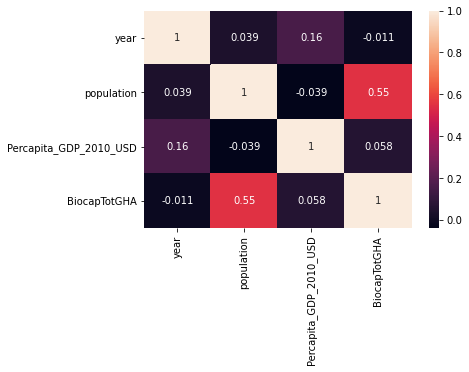

In [96]:
corrMatrix = data_final_allCountry2.corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [97]:
# Decoupage en variables expicatives et cible
features_list2 = ['UN_region','year', 'population', 'Percapita_GDP_2010_USD']
target_variable2 = 'BiocapTotGHA'
x = data_final_allCountry2.loc[:, features_list2]
y = data_final_allCountry2.loc[:, target_variable2]

In [98]:
print("...Done.")
print()

print('y : ')
print(y.head())
print()
print('x :')
print(x.head())

...Done.

y : 
4352    1.853167e+06
6210    8.169037e+06
8418    2.992662e+07
4375    1.797317e+06
1628    4.829478e+07
Name: BiocapTotGHA, dtype: float64

x :
     UN_region  year  population  Percapita_GDP_2010_USD
4352    Africa  2001   1871000.0                 903.385
6210    Africa  2001   3655000.0                 603.105
8418    Africa  2001  10861000.0                 961.500
4375    Africa  1975   1149000.0                 397.597
1628    Africa  1975   1556000.0                2060.640


In [99]:
# Détection automatique des positions des caractéristiques numériques/catégorielles
idx = 0
numeric_features2 = []
numeric_indices2 = []
categorical_features2 = []
categorical_indices2 = []
for i,t in x.dtypes.iteritems():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features2.append(i)
        numeric_indices2.append(idx)
    else :
        categorical_features2.append(i)
        categorical_indices2.append(idx)

    idx = idx + 1

print('Found numeric features ', numeric_features2,' at positions ', numeric_indices2)
print('Found categorical features ', categorical_features2,' at positions ', categorical_indices2)

Found numeric features  ['year', 'population', 'Percapita_GDP_2010_USD']  at positions  [1, 2, 3]
Found categorical features  ['UN_region']  at positions  [0]


In [100]:
# Diviser le jeu de données Train set & Test set 
print("Dividing into train and test sets...")
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, 
                                                    random_state=0)
print("...Done.")
print()


Dividing into train and test sets...
...Done.



In [101]:
sorted(x_train['UN_region'].unique())

['Africa',
 'Asia',
 'Europe',
 'Latin America and the Caribbean',
 'North America',
 'Oceania']

In [102]:
# Convert pandas DataFrames to numpy arrays before using scikit-learn
print("Convert pandas DataFrames to numpy arrays...")
x_train = x_train.values
x_test = x_test.values
y_train = y_train.tolist()
y_test = y_test.tolist()
print("...Done")

print(x_train[0:5,:])
print(x_test[0:2,:])
print()
print(y_train[0:5])
print(y_test[0:2])

Convert pandas DataFrames to numpy arrays...
...Done
[['Europe' 1993 57576000.0 28967.2]
 ['Latin America and the Caribbean' 1966 315000.0 13808.7]
 ['Europe' 1999 10281000.0 14160.9]
 ['Asia' 2005 67861000.0 9691.82]
 ['Europe' 1994 8789000.0 36419.5]]
[['Latin America and the Caribbean' 2005 3319000.0 6114.22]
 ['Africa' 1961 7007000.0 377.79900000000004]]

[72868182.59, 189976.06, 27098650.59, 116660330.3, 96131479.27]
[11546623.04, 12143649.83]


In [103]:
# Missing values
from sklearn.impute import SimpleImputer

print("Imputing missing values...")
print(x_train[0:5,:])
print()
imputer = SimpleImputer(strategy="mean")
x_train[:,numeric_indices2] = imputer.fit_transform(x_train[:,numeric_indices2])
print("...Fini!")
print(x_train[0:5,:]) 
print()

Imputing missing values...
[['Europe' 1993 57576000.0 28967.2]
 ['Latin America and the Caribbean' 1966 315000.0 13808.7]
 ['Europe' 1999 10281000.0 14160.9]
 ['Asia' 2005 67861000.0 9691.82]
 ['Europe' 1994 8789000.0 36419.5]]

...Fini!
[['Europe' 1993.0 57576000.0 28967.2]
 ['Latin America and the Caribbean' 1966.0 315000.0 13808.7]
 ['Europe' 1999.0 10281000.0 14160.9]
 ['Asia' 2005.0 67861000.0 9691.82]
 ['Europe' 1994.0 8789000.0 36419.5]]



In [104]:
# Encoding categorical features and standardizing numerical features
from sklearn.preprocessing import   StandardScaler, OneHotEncoder
print("Encoding categorical features and standardizing numerical features...")
print()
print(x_train[0:5,:])

# Normalization
numeric_transformer2 = StandardScaler()

# OHE / dummyfication
categorical_transformer2 = OneHotEncoder(drop='first')

featureencoder2 = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer2, categorical_indices2),    
        ('num', numeric_transformer2, numeric_indices2)
        ]
    )

x_train = featureencoder2.fit_transform(x_train)
print("...Done")
print(x_train[0:5,:])


Encoding categorical features and standardizing numerical features...

[['Europe' 1993.0 57576000.0 28967.2]
 ['Latin America and the Caribbean' 1966.0 315000.0 13808.7]
 ['Europe' 1999.0 10281000.0 14160.9]
 ['Asia' 2005.0 67861000.0 9691.82]
 ['Europe' 1994.0 8789000.0 36419.5]]
...Done
[[ 0.          1.          0.          0.          0.          0.2472263
   0.23924445  1.23451256]
 [ 0.          0.          1.          0.          0.         -1.49812148
  -0.27089576  0.25411114]
 [ 0.          1.          0.          0.          0.          0.63508136
  -0.18210832  0.27689026]
 [ 1.          0.          0.          0.          0.          1.02293643
   0.33087387 -0.01215498]
 [ 0.          1.          0.          0.          0.          0.31186881
  -0.1954006   1.71650257]]


In [105]:
# Get categorical columns names
(featureencoder2.transformers_[0][1]).get_feature_names()

array(['x0_Asia', 'x0_Europe', 'x0_Latin America and the Caribbean',
       'x0_North America', 'x0_Oceania'], dtype=object)

In [106]:
# Train model
from sklearn.linear_model import LinearRegression
print("Train model...")
regressor2 = LinearRegression()
regressor2.fit(x_train, y_train)
print("...Done.")


Train model...
...Done.


### Train modele

In [107]:
# Predictions on training set
print("Predictions on training set...")
y_train_pred2 = regressor2.predict(x_train)
print("...Done.")
print(y_train_pred2)
print()


Predictions on training set...
...Done.
[1.02530920e+08 8.96576403e+07 5.87449647e+07 ... 5.94339931e+07
 2.29228243e+08 2.15111422e+07]



### Test pipeline

In [108]:
# Missing values
print("Imputing missing values...")
print(x_test[0:5,:])
print()

x_test[:,numeric_indices2] = imputer.transform(x_test[:,numeric_indices2])
print("...Done!")
print(x_test[0:5,:]) 
print() 

Imputing missing values...
[['Latin America and the Caribbean' 2005 3319000.0 6114.22]
 ['Africa' 1961 7007000.0 377.79900000000004]
 ['Europe' 1977 8246000.0 29143.8]
 ['Asia' 1963 10545000.0 269.522]
 ['Latin America and the Caribbean' 1964 11281000.0 3143.44]]

...Done!
[['Latin America and the Caribbean' 2005.0 3319000.0 6114.22]
 ['Africa' 1961.0 7007000.0 377.79900000000004]
 ['Europe' 1977.0 8246000.0 29143.8]
 ['Asia' 1963.0 10545000.0 269.522]
 ['Latin America and the Caribbean' 1964.0 11281000.0 3143.44]]



In [109]:
# Encoding categorical features and standardizing numerical features
print("Encoding categorical features and standardizing numerical features...")
print()
print(x_test[0:5,:])

x_test = featureencoder2.transform(x_test)
print("...Done")
print(x_test[0:5,:])


Encoding categorical features and standardizing numerical features...

[['Latin America and the Caribbean' 2005.0 3319000.0 6114.22]
 ['Africa' 1961.0 7007000.0 377.79900000000004]
 ['Europe' 1977.0 8246000.0 29143.8]
 ['Asia' 1963.0 10545000.0 269.522]
 ['Latin America and the Caribbean' 1964.0 11281000.0 3143.44]]
...Done
[[ 0.          0.          1.          0.          0.          1.02293643
  -0.24413302 -0.24354227]
 [ 0.          0.          0.          0.          0.         -1.82133404
  -0.2112765  -0.61455492]
 [ 0.          1.          0.          0.          0.         -0.78705387
  -0.20023821  1.24593446]
 [ 1.          0.          0.          0.          0.         -1.69204902
  -0.17975634 -0.62155792]
 [ 0.          0.          1.          0.          0.         -1.62740651
  -0.17319929 -0.43568245]]


In [110]:
# Predictions on test set
print("Predictions on test set...")
y_test_pred2 = regressor2.predict(x_test)
print("...Done.")
print(y_test_pred2)
print()

Predictions on test set...
...Done.
[8.28052743e+07 2.81424880e+07 5.92272503e+07 ... 1.06380809e+08
 1.09550277e+08 5.46880544e+07]



In [111]:
# Print R^2 scores
from sklearn.metrics import r2_score
print("R2 score on training set : ", r2_score(y_train, y_train_pred2))
print("R2 score on test set : ", r2_score(y_test, y_test_pred2))

R2 score on training set :  0.3810635009684472
R2 score on test set :  0.470566393529099


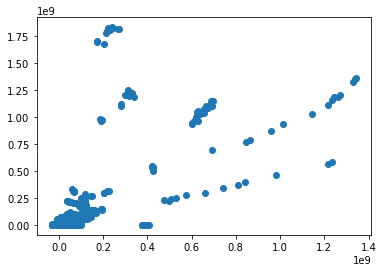

In [112]:
plt.scatter(y_test_pred2, y_test)

In [113]:
# tableau de bord statistique

import statsmodels.api as sm
model2 = sm.OLS(y_train, x_train)
result = model2.fit()
#print(result.summary())
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.434
Model:                            OLS   Adj. R-squared (uncentered):              0.433
Method:                 Least Squares   F-statistic:                              661.7
Date:                Wed, 16 Jun 2021   Prob (F-statistic):                        0.00
Time:                        20:58:24   Log-Likelihood:                     -1.4042e+05
No. Observations:                6918   AIC:                                  2.809e+05
Df Residuals:                    6910   BIC:                                  2.809e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1          1.996e+07   4.07e+06      4.905      0.000     1.2e+07    2.79e+07
x2          8.928e+07   4.71e+06     18.954      0.000       8e+07    9.85e+07
x3          1.114e+08   4.34e+06     25.636      0.000    1.03e+08     1.2e+08
x4          4.527e+08   1.49e+07     30.315      0.000    4.23e+08    4.82e+08
x5          8.439e+07   8.75e+06      9.647      0.000    6.72e+07    1.02e+08
x6           -4.3e+06   1.94e+06     -2.219      0.027    -8.1e+06   -5.01e+05
x7           1.07e+08   1.96e+06     54.585      0.000    1.03e+08    1.11e+08
x8         -1.235e+07   2.21e+06     -5.591      0.000   -1.67e+07   -8.02e+06
==============================================================================
Omnibus:                     8249.072   Durbin-Watson:                   2.032
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1025397.715
Skew:                           6.369   Prob(JB):                         0.00
Kurtosis:                      61.267   Cond. No.                         8.54
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [114]:
# Get categorical columns names
(featureencoder2.transformers_[0][1]).get_feature_names()

array(['x0_Asia', 'x0_Europe', 'x0_Latin America and the Caribbean',
       'x0_North America', 'x0_Oceania'], dtype=object)

In [115]:
data_final_allCountry2['UN_region'].unique()

array(['Africa', 'Asia', 'Europe', 'Latin America and the Caribbean',
       'North America', 'Oceania'], dtype=object)